---
title: "Plotly: Pure Perfection"
image: "https://upload.wikimedia.org/wikipedia/commons/8/8a/Plotly-logo.png"
format:
  html:
    toc: true
author: "Jun Ryu"
date: "2023-01-17"
categories: [sqlite, python, visualizations]
---

> What else can [Plotly](https://plotly.com/python/) produce? Today, we continue with the NOAA climate data and explore what other visualizations can be made.

# 1. Import Data
---

This procedure is the exact same as the last post.

In [1]:
from plotly import express as px
import plotly.figure_factory as ff
import numpy as np
import pandas as pd
import sqlite3

conn = sqlite3.connect("temps.db") # connect to database
cursor = conn.cursor() 
df1 = pd.read_csv("temps_stacked.csv")
#df1.to_sql("temperatures", conn, index=False)
df2 = pd.read_csv("countries.csv")
#df2.to_sql("countries", conn, index=False)
df3 = pd.read_csv("station-metadata.csv")
#df3.to_sql("stations", conn, index=False)

conn.close() # close connection

# 2. Maps and More Maps

---

In the previous post, we mainly worked with [`px.scatter_mapbox`](https://plotly.com/python/scattermapbox/). 

Let's see what other maps there are!

### 1. [`px.density_mapbox`](https://plotly.com/python/mapbox-density-heatmaps/): *Mapbox Density Heatmap*

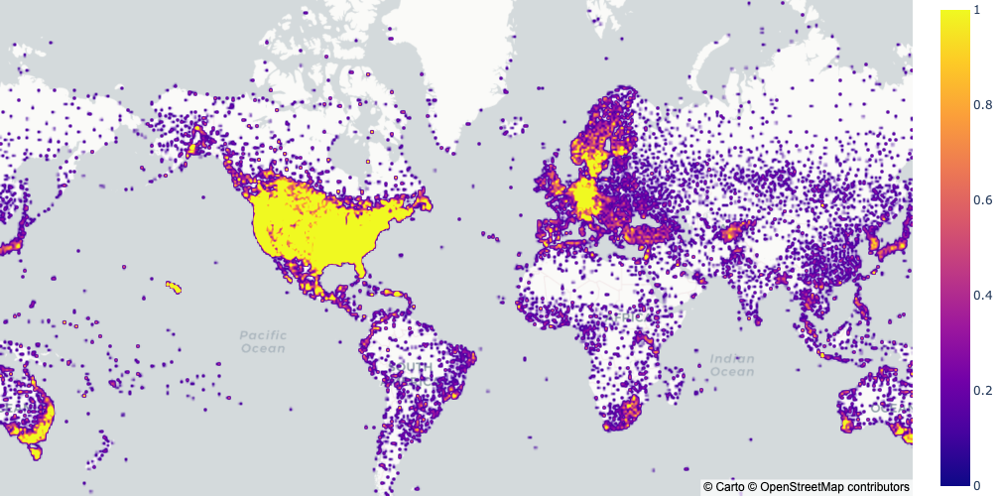

In [2]:
# using the stations data
fig = px.density_mapbox(df3, 
                        lat='LATITUDE', 
                        lon='LONGITUDE', 
                        radius=2,
                        zoom=0.8,
                        height = 500)

fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

<br>

Woah! The above produces a heatmap comparing the density of stations. The brighter color (like that of the US) represents that there are more stations clustered in that region. We can play around with the various arguments to get different results. 

For example, the following plot will focus on Europe:

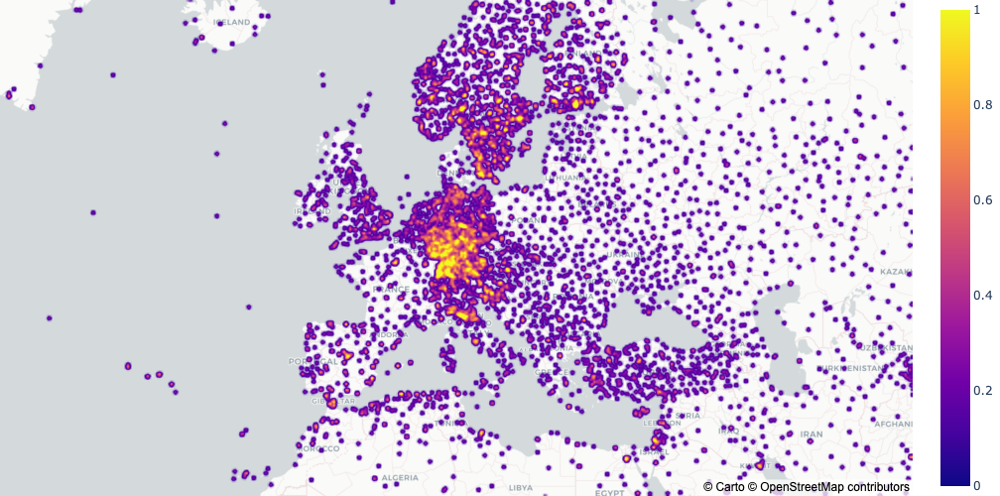

In [3]:
fig = px.density_mapbox(df3, 
                        lat='LATITUDE', 
                        lon='LONGITUDE', 
                        radius=3.5,
                        zoom=2.5,
                        height = 500, 
                        center={"lat" : 50, "lon" : 10})

fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

<br>

---

### 2. [`px.scatter_geo`](https://plotly.com/python/bubble-maps/): *Bubble Map*

Now, suppose we wanted to know the *exact* number of stations in each country. We first write a simple function to grab the data we need.

In [4]:
def station_count():
    """
    Function to count the number of stations in each country
    """
    
    conn = sqlite3.connect("temps.db")
    cmd = f"SELECT C.Name Country, COUNT(S.Name) Count \
    FROM stations S \
    LEFT JOIN countries C on SUBSTRING(S.id, 1, 2) = C.'FIPS 10-4' GROUP BY Country"
    df = pd.read_sql_query(cmd, conn)
    conn.close()
    return df

In [5]:
count_df = station_count()
count_df

,Country,Count
0,None,19
1,Afghanistan,6
2,Albania,7
3,Algeria,100
4,American Samoa,2
...,...,...
232,Wallis and Futuna,4
233,Western Sahara,3
234,Yemen,4
235,Zambia,19


Now that we have the data, let's get to plotting our bubble map.

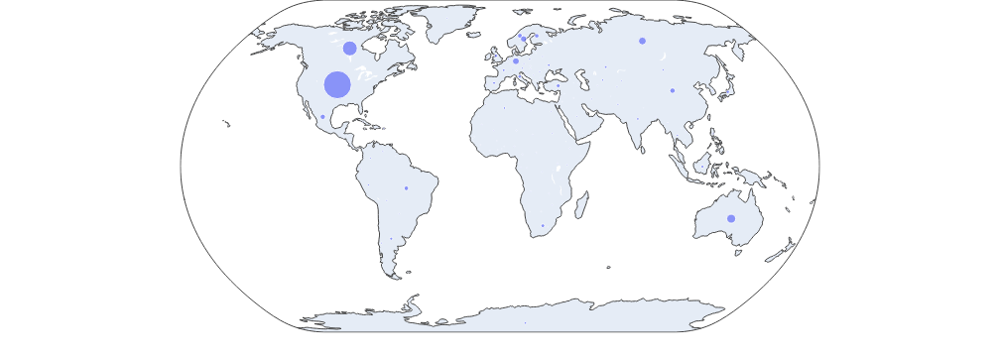

In [6]:
fig = px.scatter_geo(count_df, locations="Country", locationmode="country names",
                     hover_name="Country", size="Count",
                     projection="natural earth", height = 300)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":25})
fig.show()

With the above, we definitely get the information that we wanted, but in terms of visualization, it's not the best. Most bubbles are barely visible due to their small station count. How can we fix this?

---

### 3. [`px.choropleth`](https://plotly.com/python/choropleth-maps/): *Choropleth Map*

We will essentially run the same code but using `px.choropleth`.

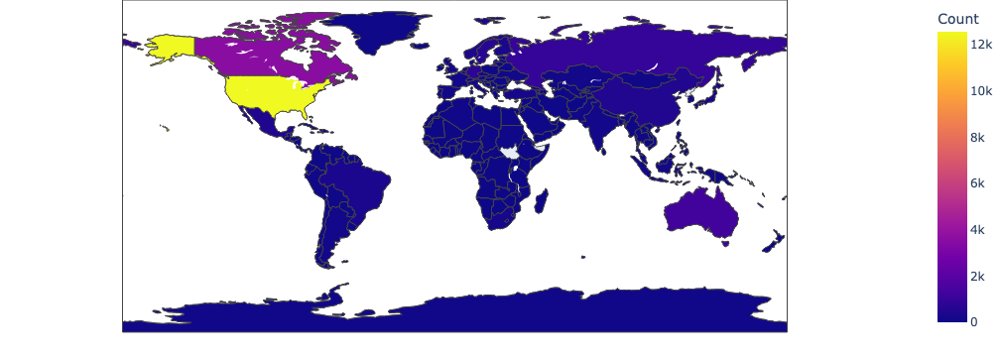

In [7]:
fig = px.choropleth(count_df, locations="Country", locationmode="country names",
                     hover_name="Country", color="Count", height = 300)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":25})
fig.show()

<br>
Slightly better, but still not great. To fix this issue, we will use one of the most common tricks used in data transformation: taking the logarithm of the response values.

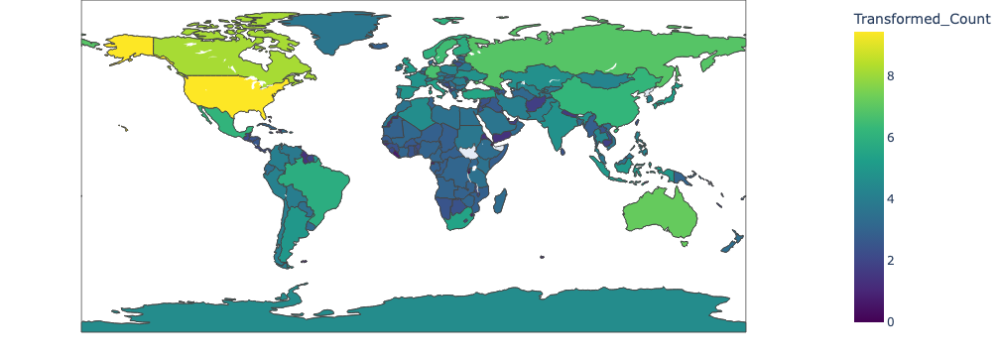

In [8]:
count_df["Transformed_Count"] = np.log(count_df["Count"])
fig = px.choropleth(count_df, locations="Country", locationmode="country names",
                    color="Transformed_Count", hover_name="Country",
                    color_continuous_scale="Viridis")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":25})
fig.show()

This is much better. Now that we are working off of an exponential scale, the distinctions are much more clear. To get the station count number, we can simply compute $e^x$, where $x$ is the transformed count for that specific country.

---

### 4. [`ff.create_hexbin_mapbox`](https://plotly.com/python/hexbin-mapbox/): *Hexbin Mapbox*

We return to our old friend Mapbox, and try to replicate the visualization in Part 1 but with a twist.

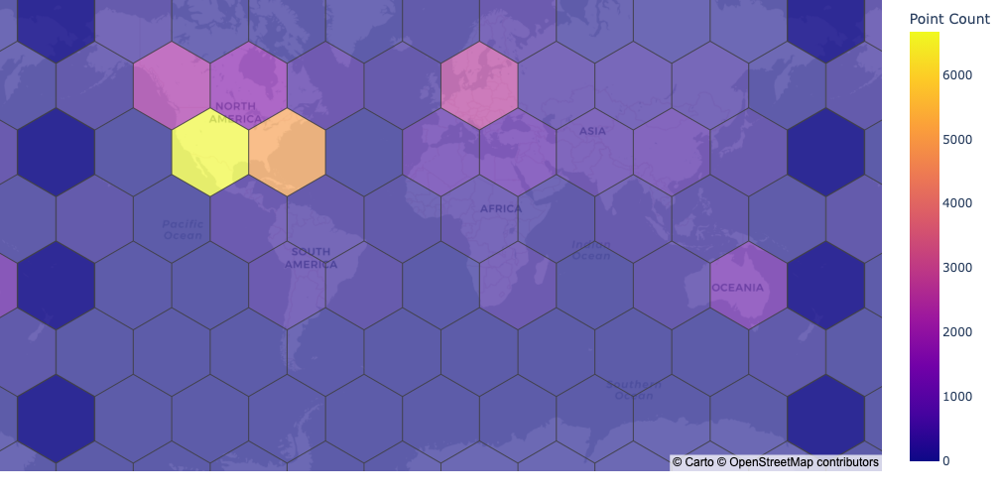

In [9]:
df3_fix = df3.drop(1752) # drop an observation that will cause an error

fig = ff.create_hexbin_mapbox(
    data_frame=df3_fix, lat="LATITUDE", lon="LONGITUDE", 
    nx_hexagon=10, opacity=0.6, labels={"color": "Point Count"}, 
    zoom = 0.6, height=500
)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":25})
fig.update_layout(mapbox_style="carto-positron")
fig.show()

The above is similar to a density heatmap, but it is organized in hexagonal regions. We can play around with the arguments to get a cleaner plot:

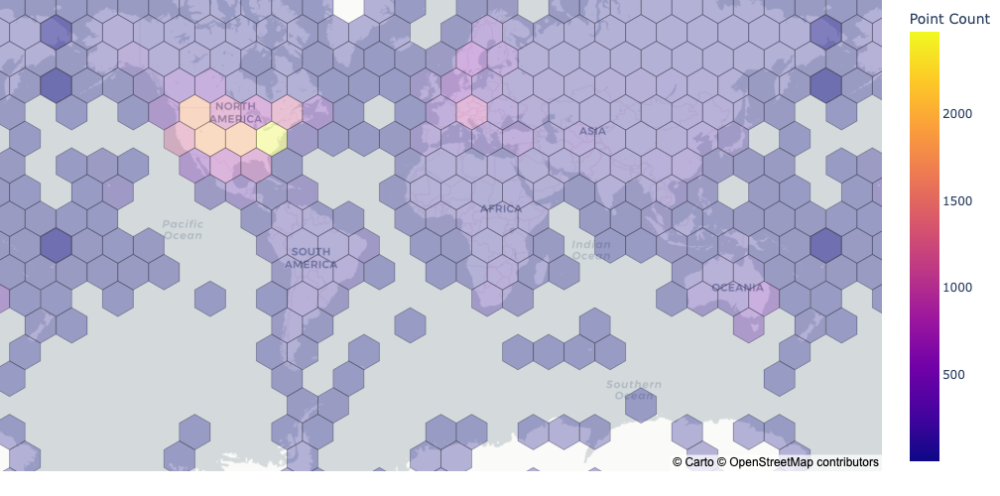

In [10]:
fig = ff.create_hexbin_mapbox(
    data_frame=df3_fix, lat="LATITUDE", lon="LONGITUDE", 
    nx_hexagon=25, opacity=0.3, labels={"color": "Point Count"},
    min_count=1, zoom=0.6, height=500
)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":25})
fig.update_layout(mapbox_style="carto-positron")
fig.show()

Nice! The above only shows regions with at least 1 station. Now, suppose a user wanted to know the mean temperature of each region (based on stations that are in that region) for a specific year and month. How could we do that?

We start with writing a query function `query_region_temp()` that grabs the appropriate data:

In [11]:
def query_region_temp(year, month):
    """
    Query function to filter data
    Args:
    year: a specific year
    month: a specific month of the year
    Return:
    a dataframe containing all matches
    """
    
    conn = sqlite3.connect("temps.db")
    cmd = f"SELECT S.LATITUDE, S.LONGITUDE, T.Year, T.Month, T.Temp \
    FROM stations S \
    LEFT JOIN countries C on SUBSTRING(S.id, 1, 2) = C.'FIPS 10-4' \
    LEFT JOIN temperatures t on  S.id = T.id \
    WHERE T.Year = {year} AND T.Month = {month}"
    df = pd.read_sql_query(cmd, conn)
    
    conn.close()
    return df

We make sure this query function is correct:

In [12]:
query_region_temp(2000, 6)

,LATITUDE,LONGITUDE,Year,Month,Temp
0,57.7667,11.8667,2000,6,14.85
1,25.3330,55.5170,2000,6,33.09
2,25.6170,55.9330,2000,6,33.70
3,25.2550,55.3640,2000,6,32.44
4,24.4300,54.4700,2000,6,33.78
...,...,...,...,...,...
14287,-17.8170,25.8170,2000,6,17.55
14288,-14.4500,28.4670,2000,6,17.35
14289,-17.9170,31.1330,2000,6,13.53
14290,-20.1500,28.6170,2000,6,14.10


Great! It seems like the query function is correctly grabbing all temperature data that apply to a specific year and month. All that's left to do is the create the plotting function, `region_avg_plot()`:

In [13]:
def region_avg_plot(year, month, **kwargs):
    """
    Create a plot containing average temperature of each hexagonal region
    Args:
    year: a specific year
    month: a specific month of the year
    **kwargs: additional keyword arguments
    Return:
    a hexbin_mapbox plot
    """
    
    # pull the correct data using the query function
    df = query_region_temp(year = year, month = month)
    
    months = {
        1: "January", 2: "February", 3: "March", 4: "April",
        5: "May", 6: "June", 7: "July", 8: "August",
        9: "September", 10: "October", 11: "November", 12: "December"
    }
    
    # error-handling: make sure latitude is not -90
    handle = df['LATITUDE'] != -90
    df = df[handle]
    
    # create the plot
    fig = ff.create_hexbin_mapbox(
        data_frame=df, lat="LATITUDE", lon="LONGITUDE",
        nx_hexagon=25, opacity=0.3, zoom=0.6, height=500,
        color="Temp", agg_func=np.mean, color_continuous_scale="Icefire", 
        title = "Regional Average Temperature (°C) in " + months.get(month) + ", " + str(year),
        **kwargs
    )
    
    fig.layout.coloraxis.colorbar.title = 'Temperature (°C)' 
    fig.update_layout(margin=dict(l=50, r=50, t=100, b=50)) 
    fig.update_layout(mapbox_style="carto-positron")
    return fig

Last but not least, let's test this function:

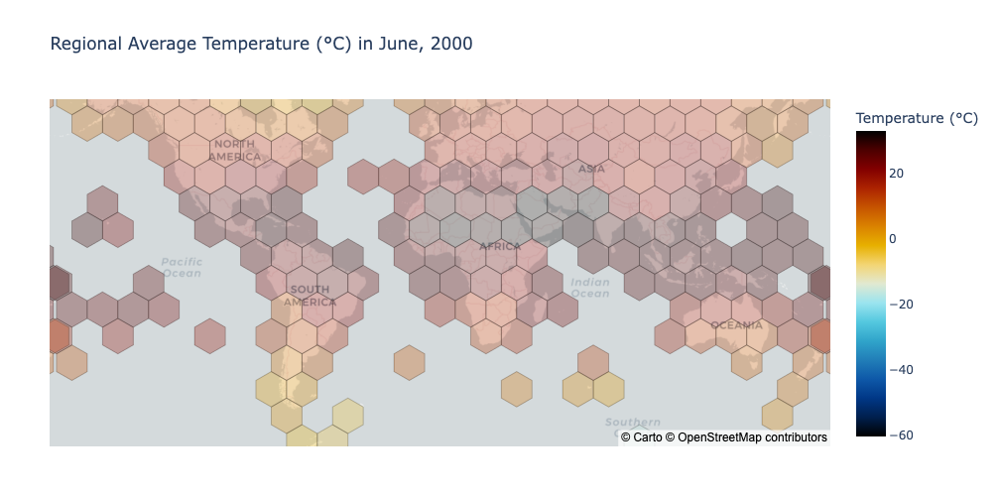

In [14]:
region_avg_plot(2000,6)